In [31]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

from scipy import stats

import plotly.express as px
import plotly.io as pio
pio.renderers.default = 'notebook'


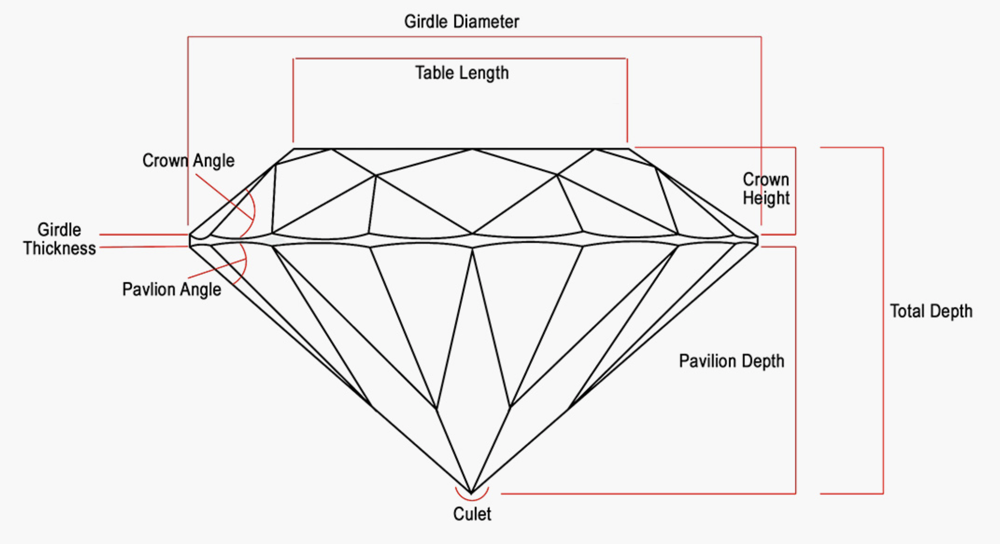</img>

In [7]:
data = pd.read_csv('data/Diamonds Prices2022.csv', index_col=0)
data.head()

,carat,cut,color,clarity,depth,table,price,x,y,z
1,0.23,Ideal,E,SI2,61.5,55.0,326,3.95,3.98,2.43
2,0.21,Premium,E,SI1,59.8,61.0,326,3.89,3.84,2.31
3,0.23,Good,E,VS1,56.9,65.0,327,4.05,4.07,2.31
4,0.29,Premium,I,VS2,62.4,58.0,334,4.20,4.23,2.63
5,0.31,Good,J,SI2,63.3,58.0,335,4.34,4.35,2.75


In [8]:
data.info()

<class 'pandas.DataFrame'>
RangeIndex: 53943 entries, 1 to 53943
Data columns (total 10 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   carat    53943 non-null  float64
 1   cut      53943 non-null  str    
 2   color    53943 non-null  str    
 3   clarity  53943 non-null  str    
 4   depth    53943 non-null  float64
 5   table    53943 non-null  float64
 6   price    53943 non-null  int64  
 7   x        53943 non-null  float64
 8   y        53943 non-null  float64
 9   z        53943 non-null  float64
dtypes: float64(6), int64(1), str(3)
memory usage: 4.1 MB


In [5]:
data = data[:5000]

**Что нужно сделать:**
1. Выяснить, от чего больше всего зависит вес бриллианта в каратах и меняется ли эта зависимость от типа огранки.
2. Понять, как распределены значения глубины среди бриллиантов в датасете, и  определить, есть ли доминирующие диапазоны глубины.
3. Выяснить, каким образом распределены веса бриллиантов в каратах в наборе данных. Есть ли среди них выбросы? Существуют ли статистически значимые различия в весе между группами с разной огранкой?
4. Описать набор данных и ответить на вопрос: какой цвет и огранка преобладают?

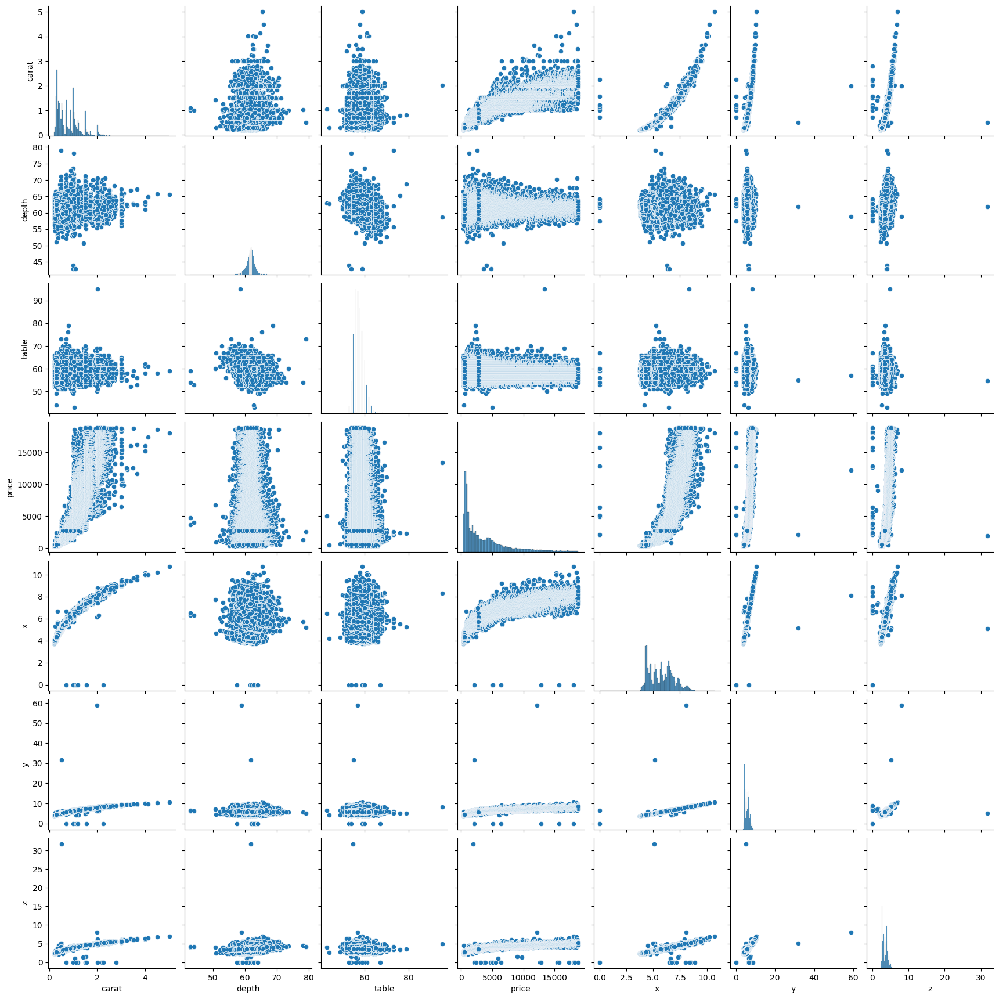

In [9]:
sns.pairplot(data);

<Axes: xlabel='x', ylabel='carat'>

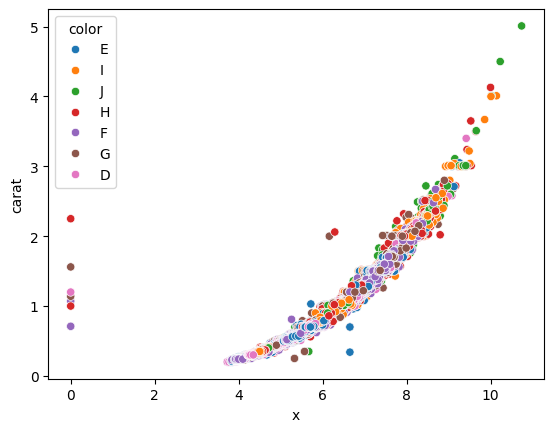

In [ ]:
# диаграмма рассеивания по цветам
sns.scatterplot(data=data, x='x', y='carat', hue='color')

<Axes: xlabel='depth', ylabel='Count'>

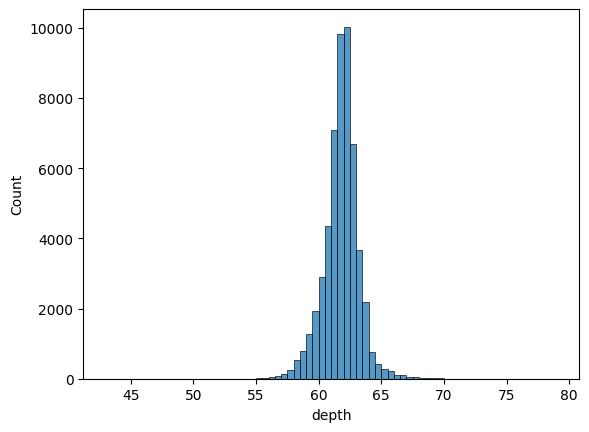

In [13]:
sns.histplot(data.depth, binwidth=0.5)

In [14]:
data.depth.min(), data.depth.max()

(np.float64(43.0), np.float64(79.0))

In [15]:
data.depth.mean()

np.float64(61.74932243293848)

In [8]:
stats.shapiro(data.depth)

/Users/svetlanapolisuk/Desktop/Аналитика/Питон/MyPythonProjects/.venv/lib/python3.14/site-packages/scipy/stats/_axis_nan_policy.py:592: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 53943.
  res = hypotest_fun_out(*samples, **kwds)


ShapiroResult(statistic=np.float64(0.9533681603257449), pvalue=np.float64(3.3104642336671543e-80))

Поскольку p-значение меньше 0.05, мы отвергаем нулевую гипотезу теста Шапиро-Уилка.

Это означает, что у нас есть достаточно доказательств, чтобы сказать, что данные выборки не получены из нормального распределения.

<Axes: xlabel='carat'>

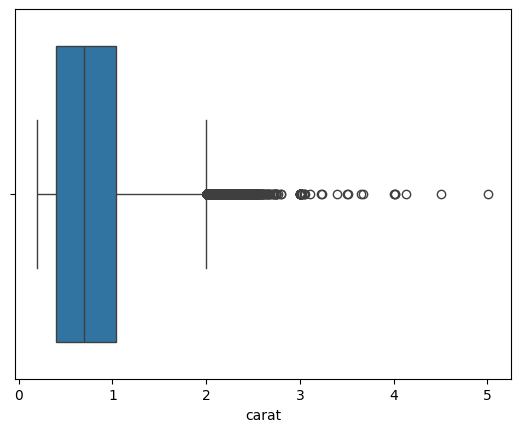

In [9]:
sns.boxplot(data=data, x='carat')

<Axes: xlabel='carat', ylabel='cut'>

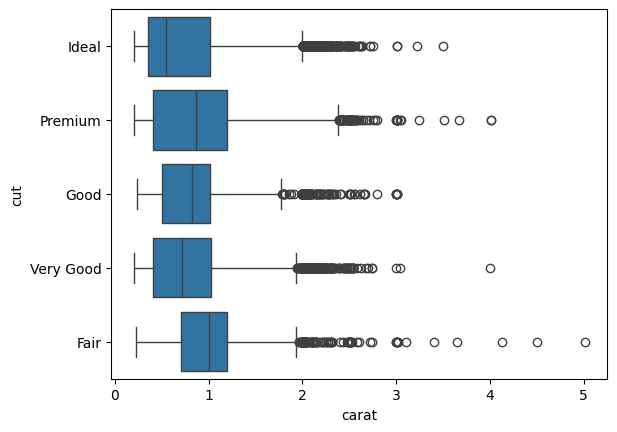

In [10]:
sns.boxplot(data=data, x='carat', y='cut')

In [11]:
data.price.mean()

np.float64(3932.734293606214)

<Axes: xlabel='price', ylabel='cut'>

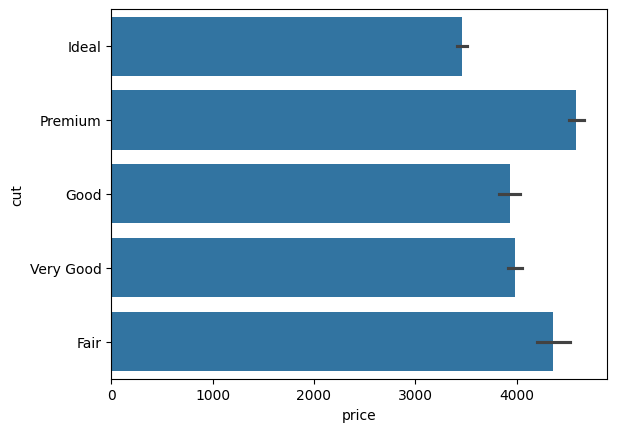

In [12]:
sns.barplot(data=data, x='price', y = 'cut')

<Axes: xlabel='cut', ylabel='count'>

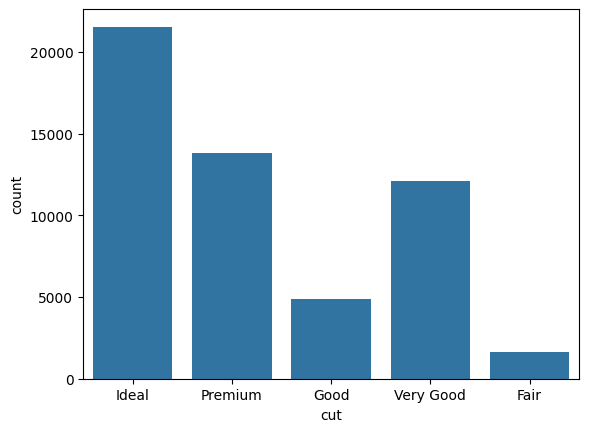

In [13]:
sns.countplot(data=data, x='cut')

In [14]:
number = ['price', 'depth', 'table', 'x', 'y', 'z', 'carat']
data[number].corr()

,price,depth,table,x,y,z,carat
price,1.000000,-0.010630,0.127118,0.884433,0.865419,0.861249,0.921591
depth,-0.010630,1.000000,-0.295798,-0.025289,-0.029340,0.094927,0.028234
table,0.127118,-0.295798,1.000000,0.195333,0.183750,0.150915,0.181602
x,0.884433,-0.025289,0.195333,1.000000,0.974701,0.970771,0.975093
y,0.865419,-0.029340,0.183750,0.974701,1.000000,0.952005,0.951721
z,0.861249,0.094927,0.150915,0.970771,0.952005,1.000000,0.953387
carat,0.921591,0.028234,0.181602,0.975093,0.951721,0.953387,1.000000


<Axes: >

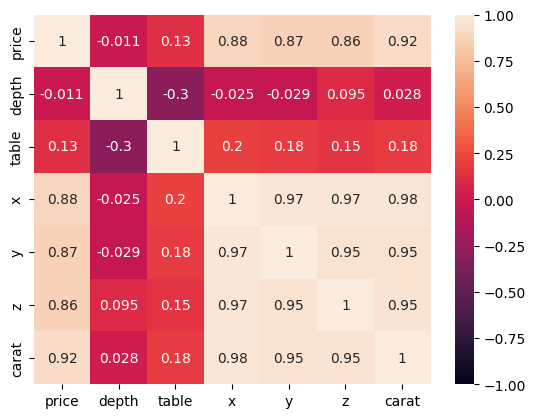

In [15]:
sns.heatmap(data[number].corr(), vmin=-1, vmax=1, annot=True)

<Axes: xlabel='x', ylabel='carat'>

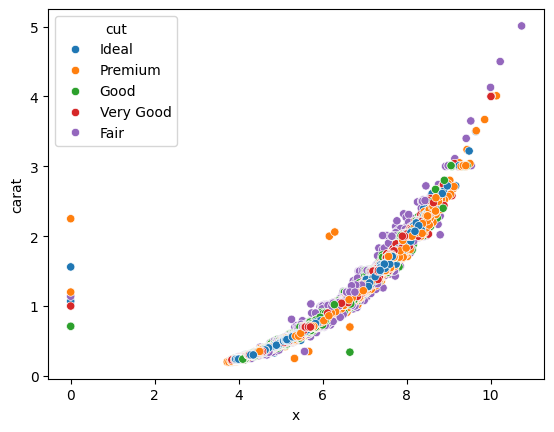

In [16]:
sns.scatterplot(data=data, x='x', y='carat', hue='cut')

Text(0, 0.5, 'carat')

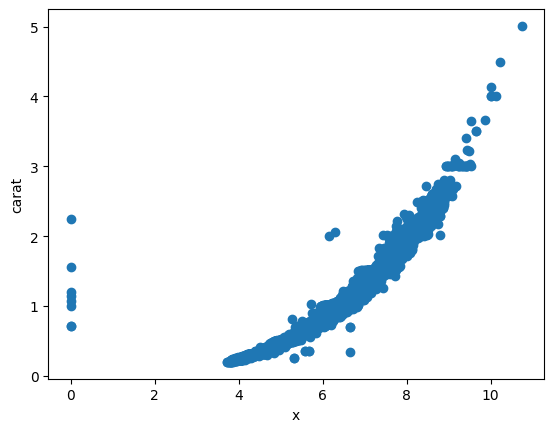

In [17]:
plt.scatter(data.x, data.carat)

plt.xlabel('x')
plt.ylabel('carat')

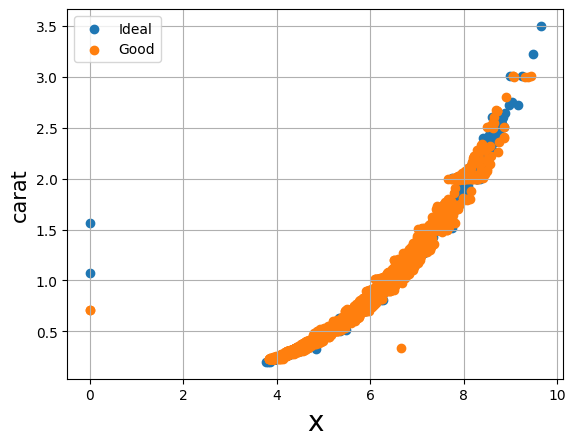

In [18]:
plt.scatter(data[data.cut == 'Ideal'].x, data[data.cut == 'Ideal'].carat, label='Ideal')
plt.scatter(data[data.cut == 'Good'].x, data[data.cut == 'Good'].carat, label='Good')

plt.xlabel('x', size=20)
plt.ylabel('carat', size=15)
plt.legend()

plt.grid()

In [19]:
data.cut.value_counts()

cut
Ideal        21551
Premium      13793
Very Good    12083
Good          4906
Fair          1610
Name: count, dtype: int64

In [20]:
data.cut.unique()

<StringArray>
['Ideal', 'Premium', 'Good', 'Very Good', 'Fair']
Length: 5, dtype: str

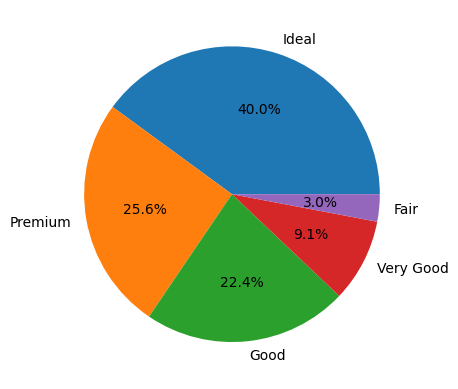

In [21]:
plt.pie(data.cut.value_counts(), labels=data.cut.unique(), autopct='%1.1f%%');

In [33]:
px.histogram(data.depth, color=data.cut)

ValueError: Mime type rendering requires nbformat>=4.2.0 but it is not installed

Figure({
    'data': [{'bingroup': 'x',
              'hovertemplate': 'color=Ideal<br>value=%{x}<br>count=%{y}<extra></extra>',
              'legendgroup': 'Ideal',
              'marker': {'color': '#636efa', 'pattern': {'shape': ''}},
              'name': 'Ideal',
              'orientation': 'v',
              'showlegend': True,
              'type': 'histogram',
              'x': {'bdata': ('AAAAAADATkBmZmZmZmZPQJqZmZmZGU' ... 'Mzs05AZmZmZmZmTkCamZmZmRlPQA=='),
                    'dtype': 'f8'},
              'xaxis': 'x',
              'yaxis': 'y'},
             {'bingroup': 'x',
              'hovertemplate': 'color=Premium<br>value=%{x}<br>count=%{y}<extra></extra>',
              'legendgroup': 'Premium',
              'marker': {'color': '#EF553B', 'pattern': {'shape': ''}},
              'name': 'Premium',
              'orientation': 'v',
              'showlegend': True,
              'type': 'histogram',
              'x': {'bdata': ('ZmZmZmbmTUAzMzMzMzNPQDMzMzMzM0' ... 'AAgE5AAAAAAABATkBmZmZmZuZNQA=='),
                    'dtype': 'f8'},
              'xaxis': 'x',
              'yaxis': 'y'},
             {'bingroup': 'x',
              'hovertemplate': 'color=Good<br>value=%{x}<br>count=%{y}<extra></extra>',
              'legendgroup': 'Good',
              'marker': {'color': '#00cc96', 'pattern': {'shape': ''}},
              'name': 'Good',
              'orientation': 'v',
              'showlegend': True,
              'type': 'histogram',
              'x': {'bdata': ('MzMzMzNzTEBmZmZmZqZPQAAAAAAAAF' ... 'zMzIxPQM3MzMzMDE1AzczMzMyMT0A='),
                    'dtype': 'f8'},
              'xaxis': 'x',
              'yaxis': 'y'},
             {'bingroup': 'x',
              'hovertemplate': 'color=Very Good<br>value=%{x}<br>count=%{y}<extra></extra>',
              'legendgroup': 'Very Good',
              'marker': {'color': '#ab63fa', 'pattern': {'shape': ''}},
              'name': 'Very Good',
              'orientation': 'v',
              'showlegend': True,
              'type': 'histogram',
              'x': {'bdata': ('ZmZmZmZmT0BmZmZmZiZPQDMzMzMz80' ... 'mZmU5AZmZmZmZmT0AAAAAAAEBOQA=='),
                    'dtype': 'f8'},
              'xaxis': 'x',
              'yaxis': 'y'},
             {'bingroup': 'x',
              'hovertemplate': 'color=Fair<br>value=%{x}<br>count=%{y}<extra></extra>',
              'legendgroup': 'Fair',
              'marker': {'color': '#FFA15A', 'pattern': {'shape': ''}},
              'name': 'Fair',
              'orientation': 'v',
              'showlegend': True,
              'type': 'histogram',
              'x': {'bdata': ('ZmZmZmZGUEDNzMzMzIxLQDMzMzMzk1' ... 'Mzs1BAzczMzMxMUECamZmZmVlQQA=='),
                    'dtype': 'f8'},
              'xaxis': 'x',
              'yaxis': 'y'}],
    'layout': {'barmode': 'relative',
               'legend': {'title': {'text': 'color'}, 'tracegroupgap': 0},
               'margin': {'t': 60},
               'template': '...',
               'xaxis': {'anchor': 'y', 'domain': [0.0, 1.0], 'title': {'text': 'value'}},
               'yaxis': {'anchor': 'x', 'domain': [0.0, 1.0], 'title': {'text': 'count'}}}
})

In [34]:
px.box(data, x='carat')

ValueError: Mime type rendering requires nbformat>=4.2.0 but it is not installed

Figure({
    'data': [{'alignmentgroup': 'True',
              'hovertemplate': 'carat=%{x}<extra></extra>',
              'legendgroup': '',
              'marker': {'color': '#636efa'},
              'name': '',
              'notched': False,
              'offsetgroup': '',
              'orientation': 'h',
              'showlegend': False,
              'type': 'box',
              'x': {'bdata': ('cT0K16NwzT/hehSuR+HKP3E9CtejcM' ... '6F61G45j+4HoXrUbjmP2ZmZmZmZuY/'),
                    'dtype': 'f8'},
              'x0': ' ',
              'xaxis': 'x',
              'y0': ' ',
              'yaxis': 'y'}],
    'layout': {'boxmode': 'group',
               'legend': {'tracegroupgap': 0},
               'margin': {'t': 60},
               'template': '...',
               'xaxis': {'anchor': 'y', 'domain': [0.0, 1.0], 'title': {'text': 'carat'}},
               'yaxis': {'anchor': 'x', 'domain': [0.0, 1.0]}}
})

In [35]:
px.box(data, x='carat', color='cut')

ValueError: Mime type rendering requires nbformat>=4.2.0 but it is not installed

Figure({
    'data': [{'alignmentgroup': 'True',
              'hovertemplate': 'cut=Ideal<br>carat=%{x}<extra></extra>',
              'legendgroup': 'Ideal',
              'marker': {'color': '#636efa'},
              'name': 'Ideal',
              'notched': False,
              'offsetgroup': 'Ideal',
              'orientation': 'h',
              'showlegend': True,
              'type': 'box',
              'x': {'bdata': ('cT0K16NwzT9xPQrXo3DNP9ejcD0K19' ... 'tRuOY/CtejcD0K5z8AAAAAAADoPw=='),
                    'dtype': 'f8'},
              'x0': ' ',
              'xaxis': 'x',
              'y0': ' ',
              'yaxis': 'y'},
             {'alignmentgroup': 'True',
              'hovertemplate': 'cut=Premium<br>carat=%{x}<extra></extra>',
              'legendgroup': 'Premium',
              'marker': {'color': '#EF553B'},
              'name': 'Premium',
              'notched': False,
              'offsetgroup': 'Premium',
              'orientation': 'h',
              'showlegend': True,
              'type': 'box',
              'x': {'bdata': ('4XoUrkfhyj+PwvUoXI/SPylcj8L1KM' ... 'gehes/uB6F61G45j+4HoXrUbjmPw=='),
                    'dtype': 'f8'},
              'x0': ' ',
              'xaxis': 'x',
              'y0': ' ',
              'yaxis': 'y'},
             {'alignmentgroup': 'True',
              'hovertemplate': 'cut=Good<br>carat=%{x}<extra></extra>',
              'legendgroup': 'Good',
              'marker': {'color': '#00cc96'},
              'name': 'Good',
              'notched': False,
              'offsetgroup': 'Good',
              'orientation': 'h',
              'showlegend': True,
              'type': 'box',
              'x': {'bdata': ('cT0K16NwzT/Xo3A9CtfTPzMzMzMzM9' ... 'F6FK7nP0jhehSuR+k/CtejcD0K5z8='),
                    'dtype': 'f8'},
              'x0': ' ',
              'xaxis': 'x',
              'y0': ' ',
              'yaxis': 'y'},
             {'alignmentgroup': 'True',
              'hovertemplate': 'cut=Very Good<br>carat=%{x}<extra></extra>',
              'legendgroup': 'Very Good',
              'marker': {'color': '#ab63fa'},
              'name': 'Very Good',
              'notched': False,
              'offsetgroup': 'Very Good',
              'orientation': 'h',
              'showlegend': True,
              'type': 'box',
              'x': {'bdata': ('uB6F61G4zj+4HoXrUbjOP6RwPQrXo9' ... 'ZmZuY/ZmZmZmZm5j9mZmZmZmbmPw=='),
                    'dtype': 'f8'},
              'x0': ' ',
              'xaxis': 'x',
              'y0': ' ',
              'yaxis': 'y'},
             {'alignmentgroup': 'True',
              'hovertemplate': 'cut=Fair<br>carat=%{x}<extra></extra>',
              'legendgroup': 'Fair',
              'marker': {'color': '#FFA15A'},
              'name': 'Fair',
              'notched': False,
              'offsetgroup': 'Fair',
              'orientation': 'h',
              'showlegend': True,
              'type': 'box',
              'x': {'bdata': ('KVyPwvUozD+F61G4HoXrP7gehetRuO' ... 'AAAPA/pHA9Ctej8D+4HoXrUbjmPw=='),
                    'dtype': 'f8'},
              'x0': ' ',
              'xaxis': 'x',
              'y0': ' ',
              'yaxis': 'y'}],
    'layout': {'boxmode': 'group',
               'legend': {'title': {'text': 'cut'}, 'tracegroupgap': 0},
               'margin': {'t': 60},
               'template': '...',
               'xaxis': {'anchor': 'y', 'domain': [0.0, 1.0], 'title': {'text': 'carat'}},
               'yaxis': {'anchor': 'x', 'domain': [0.0, 1.0]}}
})